In [38]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from datetime import datetime
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler         
from sklearn.model_selection import train_test_split      
from sklearn.linear_model import LinearRegression         
from sklearn.metrics import mean_squared_error, r2_score   

import warnings
warnings.filterwarnings('ignore')
cnf, dth, rec, act,wth,sth = '#393e46', '#ff2e63', '#21bf73', '#fe9801','#456fe3','#78ffee' 

In [39]:
data = pd.read_csv('saveecobot_17109.csv')
data = data.drop(['value_text'], axis=1)
data.head()

,device_id,phenomenon,value,logged_at
0,17109,pm1,15.63,2021-03-28 00:00:19
1,17109,pm25,24.93,2021-03-28 00:00:19
2,17109,pm10,38.59,2021-03-28 00:00:19
3,17109,pressure_pa,1025660.00,2021-03-28 00:00:19
4,17109,humidity,62.37,2021-03-28 00:00:19


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 492243 entries, 0 to 492242
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   device_id   492243 non-null  int64  
 1   phenomenon  492243 non-null  object 
 2   value       492243 non-null  float64
 3   logged_at   492243 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 15.0+ MB


In [41]:
entry_counts = data['phenomenon'].value_counts()
number_of_entries_list = entry_counts.tolist()
entry_counts

pm1            82045
pm25           82045
pm10           82045
pressure_pa    82040
humidity       82034
temperature    82034
Name: phenomenon, dtype: int64

In [42]:
data["logged_at"] = pd.to_datetime(data["logged_at"], errors='coerce')
df = data.groupby(['logged_at', 'phenomenon'])['value'].sum().unstack().reset_index()
df['pressure_pa'] = df['pressure_pa'].div(1000)
df

phenomenon,logged_at,humidity,pm1,pm10,pm25,pressure_pa,temperature
0,2021-03-28 00:00:19,62.37,15.63,38.59,24.93,1025.66,8.06
1,2021-03-28 00:04:28,62.57,15.57,38.44,24.83,1025.68,8.03
2,2021-03-28 00:22:03,63.27,15.35,37.94,24.59,1025.78,7.94
3,2021-03-28 00:23:02,63.34,15.32,37.90,24.54,1025.80,7.93
4,2021-03-28 00:43:48,64.13,15.39,37.88,24.50,1025.92,7.87
...,...,...,...,...,...,...,...
82036,2023-09-12 21:15:07,64.87,7.92,16.09,11.02,1018.44,19.94
82037,2023-09-12 21:30:08,65.30,7.98,16.33,11.16,1018.52,19.70
82038,2023-09-12 21:45:07,66.05,8.84,18.32,12.49,1018.59,19.36
82039,2023-09-12 22:00:09,66.81,9.77,20.55,13.96,1018.62,19.03


In [43]:
if df.isnull().values.any():
    missing_values = df.isnull().values.sum()
    print(f'Кількість пропущенних значень: {missing_values}')
    print(df[df.isnull().values])
    df = df.dropna()
else:
    print('Наш Dataset не має пропущених значень.')

Кількість пропущенних значень: 69
phenomenon           logged_at  humidity  pm1  pm10  pm25  pressure_pa  \
2236       2021-05-10 01:14:16       NaN  NaN   NaN   NaN      1026.71   
2236       2021-05-10 01:14:16       NaN  NaN   NaN   NaN      1026.71   
2236       2021-05-10 01:14:16       NaN  NaN   NaN   NaN      1026.71   
2236       2021-05-10 01:14:16       NaN  NaN   NaN   NaN      1026.71   
2236       2021-05-10 01:14:16       NaN  NaN   NaN   NaN      1026.71   
...                        ...       ...  ...   ...   ...          ...   
69759      2023-05-07 09:30:11       NaN  NaN   NaN   NaN      1026.55   
69759      2023-05-07 09:30:11       NaN  NaN   NaN   NaN      1026.55   
69759      2023-05-07 09:30:11       NaN  NaN   NaN   NaN      1026.55   
69759      2023-05-07 09:30:11       NaN  NaN   NaN   NaN      1026.55   
69759      2023-05-07 09:30:11       NaN  NaN   NaN   NaN      1026.55   

phenomenon  temperature  
2236                NaN  
2236                NaN  

In [44]:
def trend_plot(dataframe,value):
    df['year'] = [d.year for d in df.logged_at]
    df['month'] = [d.strftime('%b') for d in df.logged_at]
    df['hour'] = [int(d.strftime('%H')) for d in df.logged_at]
    years = df['year'].unique()

    fig, axes = plt.subplots(1, 2, figsize=(14,6), dpi= 80)
    sns.boxplot(x='year', y=value, data=df, ax=axes[0])
    sns.pointplot(x='month', y=value, data=df.loc[~df.year.isin([2021, 2023]), :])

    axes[0].set_title('Year-wise Box Plot \n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Plot \n(The Seasonality)', fontsize=18)
    plt.show()

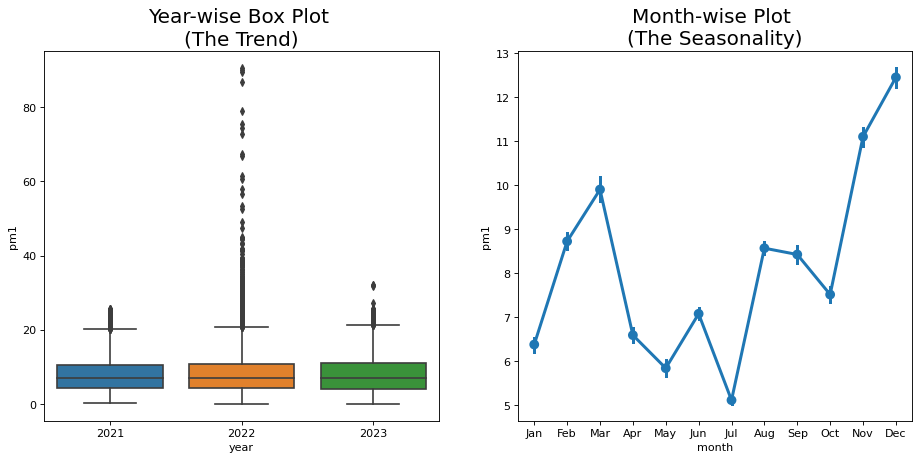

In [45]:
trend_plot(df.copy(),'pm1')

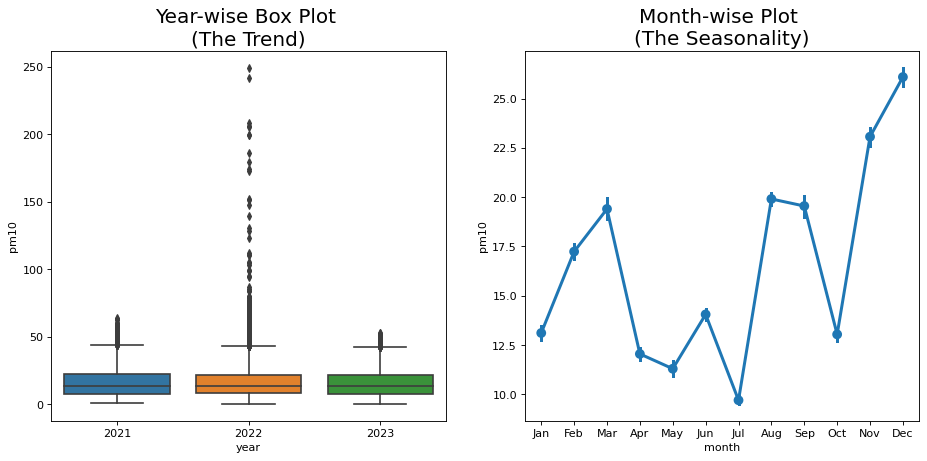

In [46]:
trend_plot(df.copy(),'pm10')

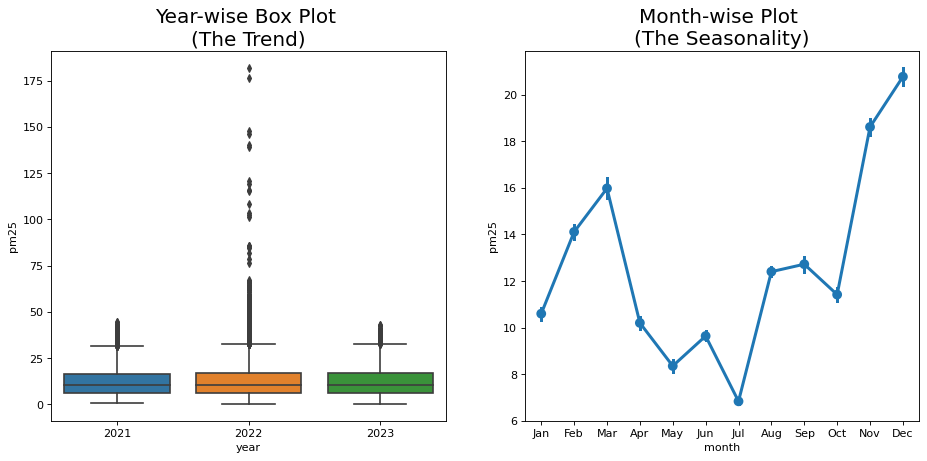

In [47]:
trend_plot(df.copy(),'pm25')

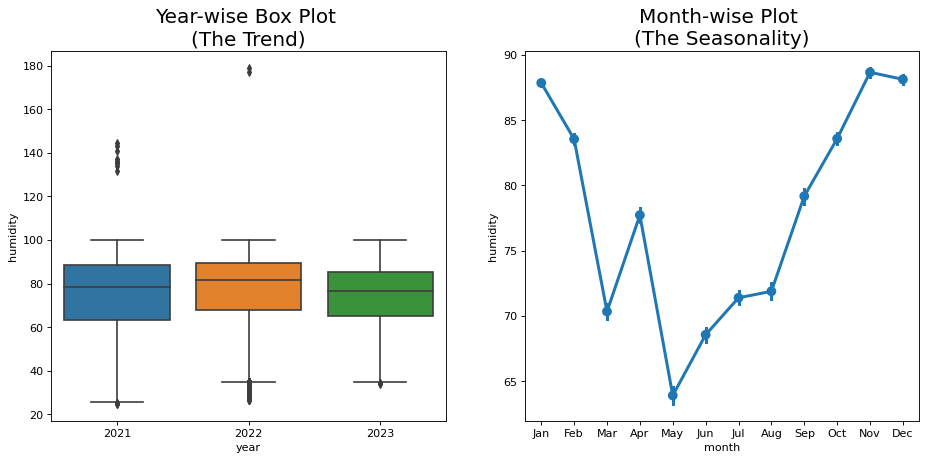

In [48]:
trend_plot(df.copy(),'humidity')

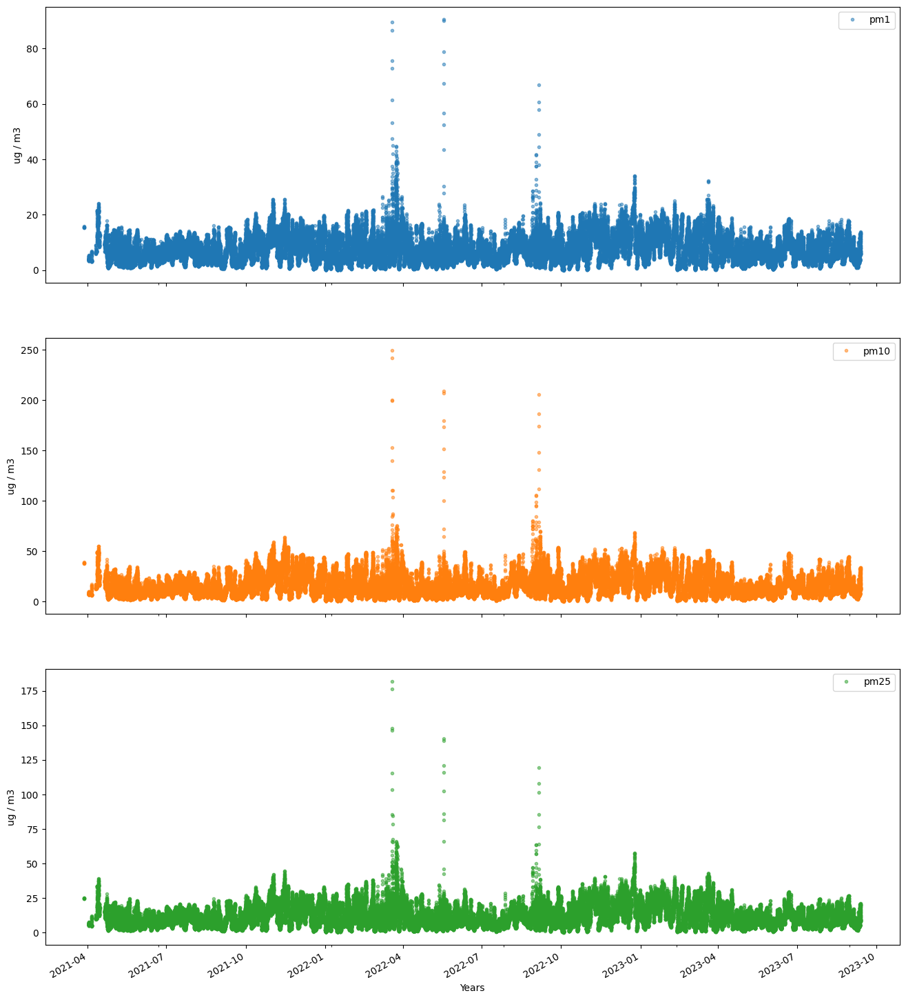

In [49]:
df.set_index('logged_at', inplace=True)
primary_pollutants=['pm1', 'pm10', 'pm25']
axes = df[primary_pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(16, 20), subplots=True)
for ax in axes:
    ax.set_xlabel('Years')
    ax.set_ylabel('ug / m3')

In [50]:
temp=df.groupby('logged_at')['pm1', 'pm10', 'pm25'].sum().reset_index()
temp=temp.melt(id_vars="logged_at",value_vars=['pm1', 'pm10', 'pm25'],var_name='Pollutants',value_name='Value')
temp.head()
fig=px.area(temp,x='logged_at',y='Value',color='Pollutants',height=600,title='Primary Pollutant over time',color_discrete_sequence=[cnf, dth, rec, act, wth, sth])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

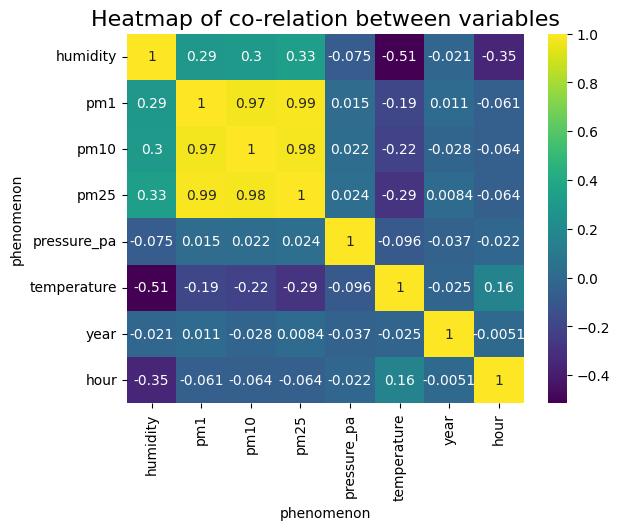

In [51]:
sns.heatmap(df.corr(),annot=True,cmap='viridis')
plt.title('Heatmap of co-relation between variables',fontsize=16)
plt.show()

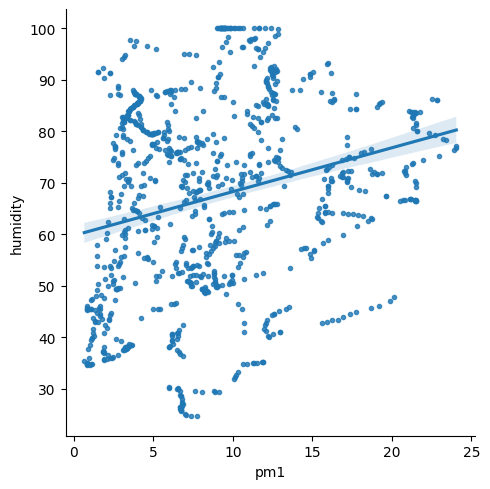

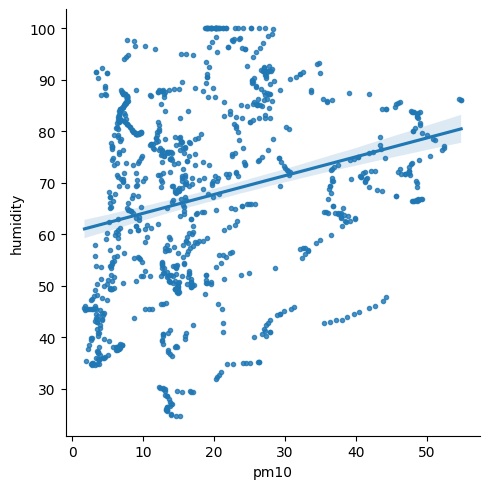

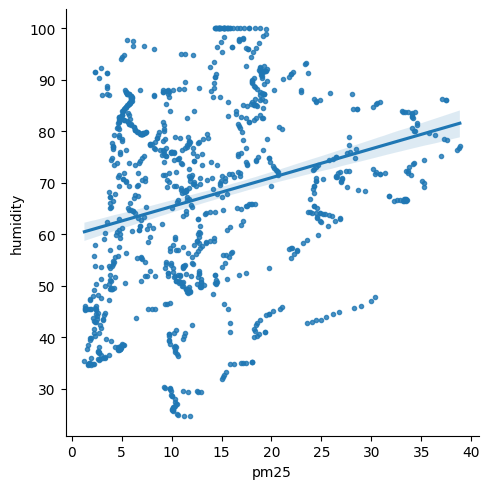

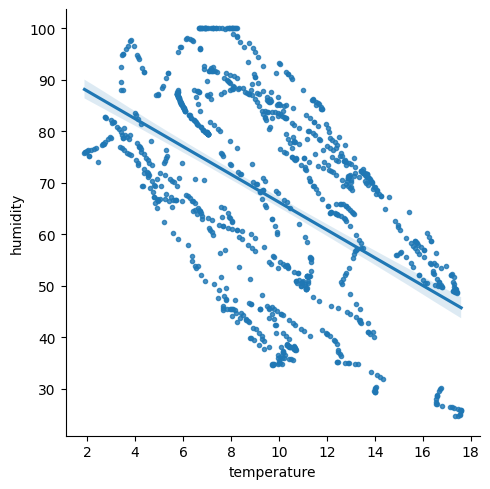

In [52]:
for i in ['pm1', 'pm10', 'pm25', 'temperature']:
    sns.lmplot(x=i,y='humidity',data=df.iloc[:1000],markers='.')

# LR

In [53]:
col_ = df.columns.tolist()[:-2]

X = df[col_].drop('pm25',1)     
y = df['pm25']                    

ss = StandardScaler()     

X_std = ss.fit_transform(X)     

X_train, X_test, y_train, y_test = train_test_split(X_std,y,test_size=0.3, random_state=42)

In [54]:
lr=LinearRegression()
lr_model=lr.fit(X_train,y_train)          

In [55]:
print('Intercept:',lr_model.intercept_)
print('--------------------------------')
print('Slope:')
list(zip(X.columns.tolist(),lr_model.coef_))

Intercept: 12.081831512952776
--------------------------------
Slope:


[('humidity', -0.05350524485930819),
 ('pm1', 5.306343194766104),
 ('pm10', 2.310909605287633),
 ('pressure_pa', -0.02844845701810217),
 ('temperature', -0.7503051993502812),
 ('year', 0.05042204883280746)]

<AxesSubplot: xlabel='pm1', ylabel='pm25'>

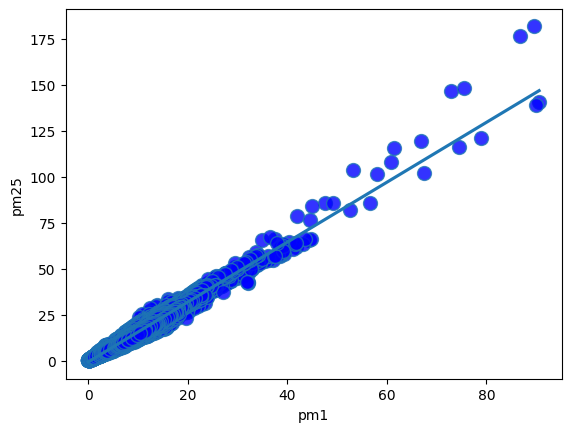

In [56]:
sns.regplot(x='pm1', y='pm25', data=df, ci=None, scatter_kws={'s':100, 'facecolor':'blue'})

In [57]:
y_pred = lr_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test,y_pred))  
score = r2_score(y_test, y_pred)
print("R2 Score:", score)
print('Baseline RMSE of model:',rmse)

R2 Score: 0.9906604818269833
Baseline RMSE of model: 0.7569367155823519


<AxesSubplot: xlabel='hour', ylabel='pm25'>

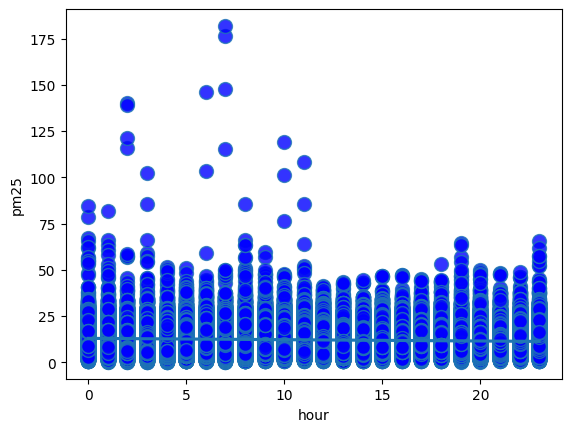

In [58]:
sns.regplot(x='hour', y='pm25', data=df, ci=None, scatter_kws={'s':100, 'facecolor':'blue'})

In [59]:
y_pred = lr_model.predict(X_test)
predictions_df_pm25 = pd.DataFrame({
    'Actual PM25': y_test,
    'Predicted PM25': y_pred
})

In [60]:
print(predictions_df_pm25)

                     Actual PM25  Predicted PM25
logged_at                                       
2021-06-11 16:07:22         5.09        4.626815
2022-03-27 14:45:07         1.66        2.231659
2021-04-24 22:47:17         3.22        3.445667
2022-08-28 11:30:06        12.99       13.333330
2022-11-16 07:00:13        22.64       20.856891
...                          ...             ...
2023-07-26 08:00:10         7.02        6.766392
2022-03-08 03:00:09        19.43       20.253139
2021-09-15 08:47:23         6.05        5.894118
2021-11-03 19:15:07        16.97       17.177626
2021-09-05 09:40:03         3.13        3.127984

[24607 rows x 2 columns]


In [61]:
predictions_df_pm1 = pd.DataFrame({
    'Actual PM1': y_test,
    'Predicted PM1': y_pred
})

In [62]:
print(predictions_df_pm1)

                     Actual PM1  Predicted PM1
logged_at                                     
2021-06-11 16:07:22        5.09       4.626815
2022-03-27 14:45:07        1.66       2.231659
2021-04-24 22:47:17        3.22       3.445667
2022-08-28 11:30:06       12.99      13.333330
2022-11-16 07:00:13       22.64      20.856891
...                         ...            ...
2023-07-26 08:00:10        7.02       6.766392
2022-03-08 03:00:09       19.43      20.253139
2021-09-15 08:47:23        6.05       5.894118
2021-11-03 19:15:07       16.97      17.177626
2021-09-05 09:40:03        3.13       3.127984

[24607 rows x 2 columns]
